### Laboratorium 5 - zadania - transformacja Hougha

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

#### Zadanie 1

Zbadaj wpływ parametrów transformacji Hougha na jakość detekcji prostych na przykładzie obrazu `norway`. Wykorzystaj ulubiony detektor krawędzi i zaprezentuj jego wynik przed użyciem transformacji Hougha. Zapoznaj się z dokumentacją funkcji [`cv2.HoughLines`](https://docs.opencv.org/4.5.3/dd/d1a/group__imgproc__feature.html#ga46b4e588934f6c8dfd509cc6e0e4545a), zwłaszcza parametrami sterującymi rozdzielczością `rho`, `theta` oraz progiem (`threshold`). Błędnie dobrany próg może szczególnie negatywnie wpłynąć na wyniki.

Zacznij od znalezienia odpowiednich parametrów detektora krawędzi - jeśli na tym etapie wyniki będą słabe, to dalej będzie tylko gorzej (_garbage-in, garbage-out_) - ale nie skupiaj się na badaniu ich wpływu na wyniki.

Zadanie _nie_ polega na zrobieniu grid searcha parametrów transformacji Hougha, tylko na zrozumieniu zachowania parametrów `rho` i `theta`, oraz wpływu progu.

Ostateczny rezultat zaprezentuj w postaci odcinków naniesionych na kopię obrazu wejściowego (patrz komórka `[3]`).

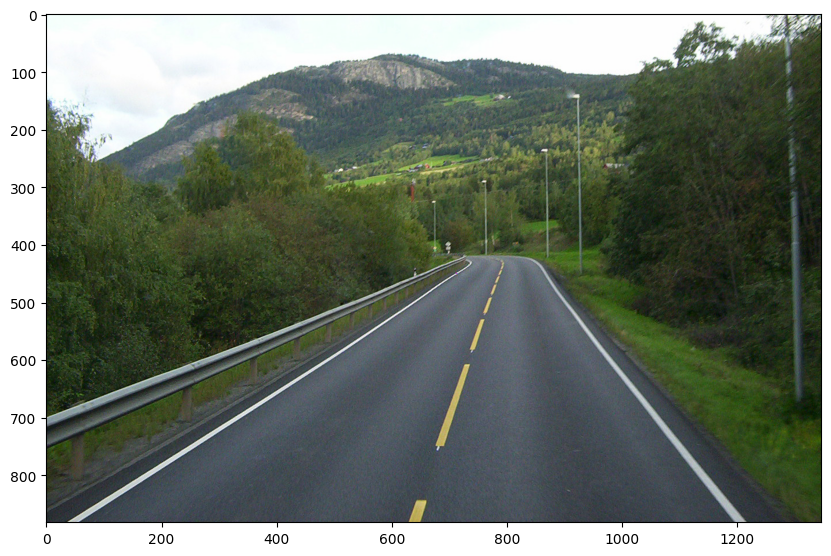

In [2]:
norway = cv2.imread('dane/norway.jpg')
plt.subplots(1, 1, figsize=(10,10))[1].imshow(norway[..., ::-1]);

In [3]:
def rhotheta2xy(line):
    # konwersja parametrów prostej w układzie rho-theta do odcinka w układzie kartezjańskim
    # wynik można użyć jako argumenty funkcji cv2.line
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 5000*(-b))
    y1 = int(y0 + 5000*(a))
    x2 = int(x0 - 5000*(-b))
    y2 = int(y0 - 5000*(a))
    return x1, y1, x2, y2

Rozwiązanie:

In [4]:
norway_gray = cv2.cvtColor(norway, cv2.COLOR_BGR2GRAY)

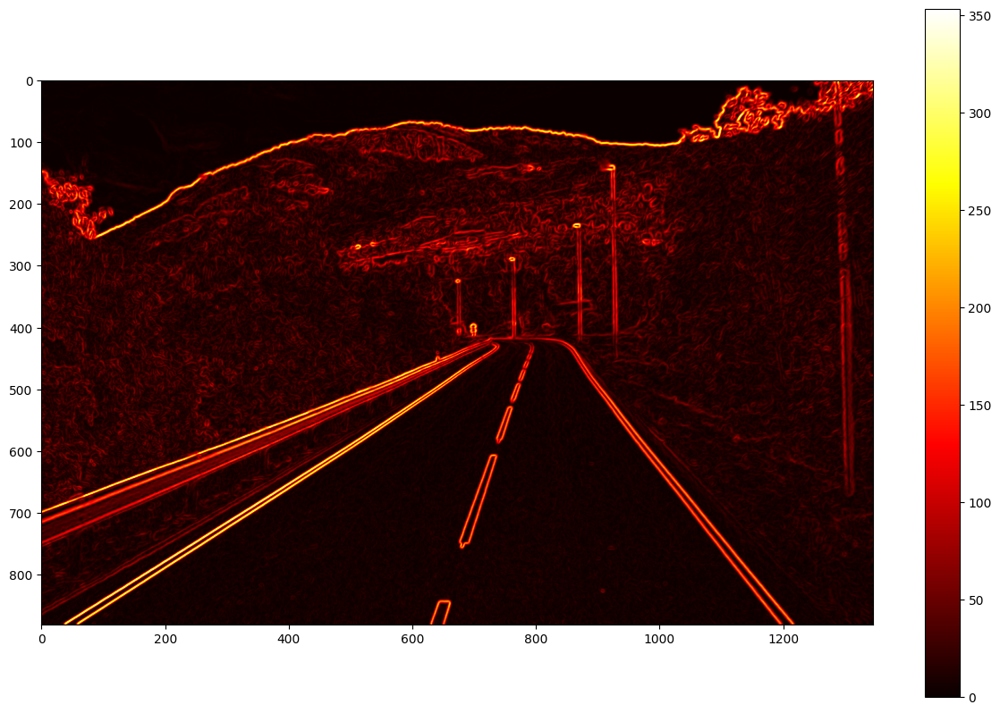

In [5]:
gauss = cv2.GaussianBlur(norway_gray, (7, 7), 0)
sobelx = cv2.Sobel(src=gauss, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3)
sobely = cv2.Sobel(src=gauss, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3)
G = np.sqrt((sobelx**2) + (sobely**2))

plt.figure(figsize=(15,10))
im = plt.imshow(G, cmap='hot')
plt.colorbar(im)

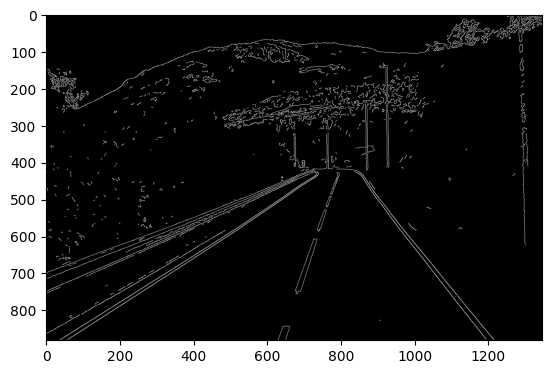

In [6]:
edges = cv2.Canny(image=gauss, threshold1=60, threshold2 = 80)
plt.imshow(edges, cmap='gray')

In [7]:
rhos = [0.5, 1, 1.5, 2]
thetas = [np.pi/90, np.pi/180, np.pi/270, np.pi/360]
threshold = [100, 150, 200, 250]

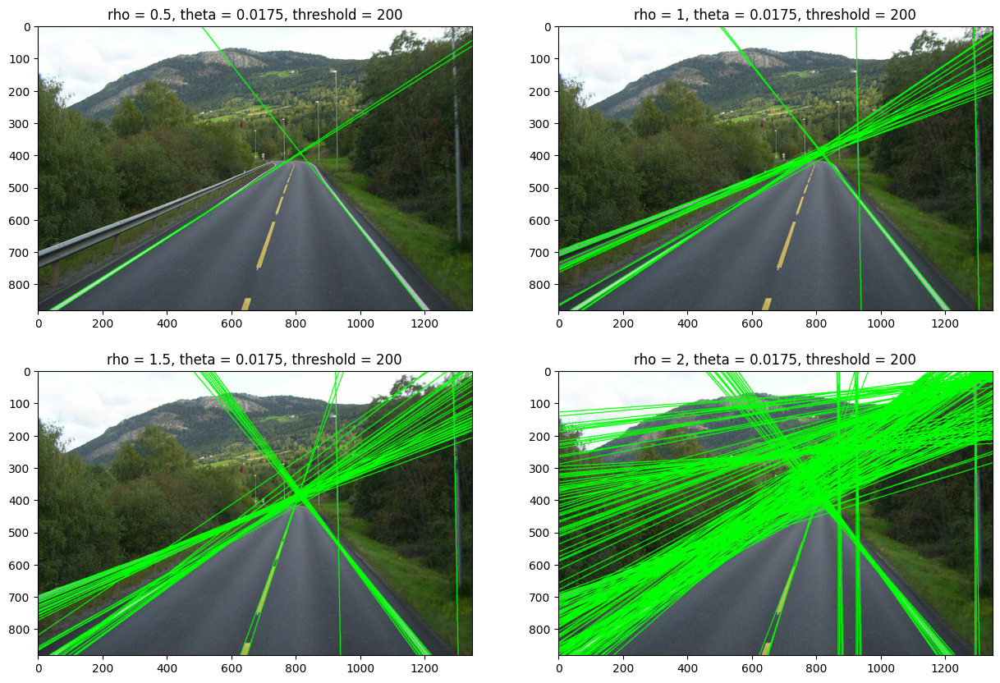

In [8]:
plt.figure(figsize=(15,10))
for i, rho in enumerate(rhos):
    img_copy = norway.copy()
    plt.subplot(2, 2, i+1)
    lines = cv2.HoughLines(edges, rho, np.pi/180, 200)
    for line in lines:
        x1, y1, x2, y2 = rhotheta2xy(line)
        cv2.line(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
    plt.imshow(img_copy[..., ::-1])
    plt.title(f'rho = {rho}, theta = {round(np.pi/180, 4)}, threshold = 200')


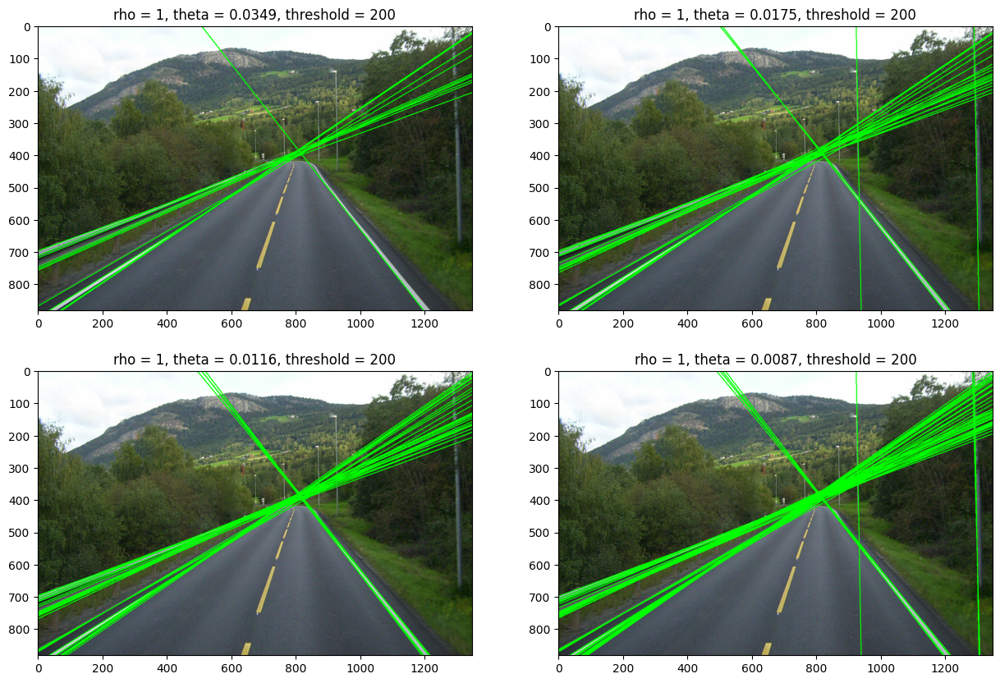

In [9]:
plt.figure(figsize=(15,10))
for i, theta in enumerate(thetas):
    img_copy = norway.copy()
    plt.subplot(2, 2, i+1)
    lines = cv2.HoughLines(edges, 1, theta, 200)
    for line in lines:
        x1, y1, x2, y2 = rhotheta2xy(line)
        cv2.line(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
    plt.imshow(img_copy[..., ::-1])
    plt.title(f'rho = {1}, theta = {round(theta, 4)}, threshold = 200')

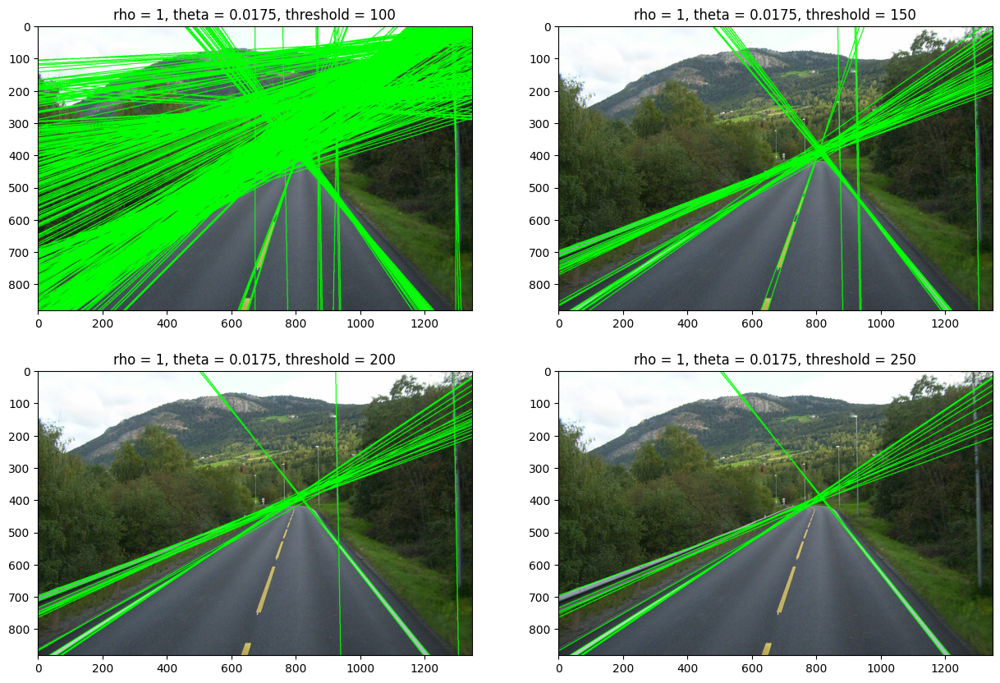

In [10]:
plt.figure(figsize=(15,10))
for i, thres in enumerate(threshold):
    img_copy = norway.copy()
    plt.subplot(2, 2, i+1)
    lines = cv2.HoughLines(edges, 1, np.pi/180, thres)
    for line in lines:
        x1, y1, x2, y2 = rhotheta2xy(line)
        cv2.line(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
    plt.imshow(img_copy[..., ::-1])
    plt.title(f'rho = {1}, theta = {round(np.pi/180, 4)}, threshold = {thres}')

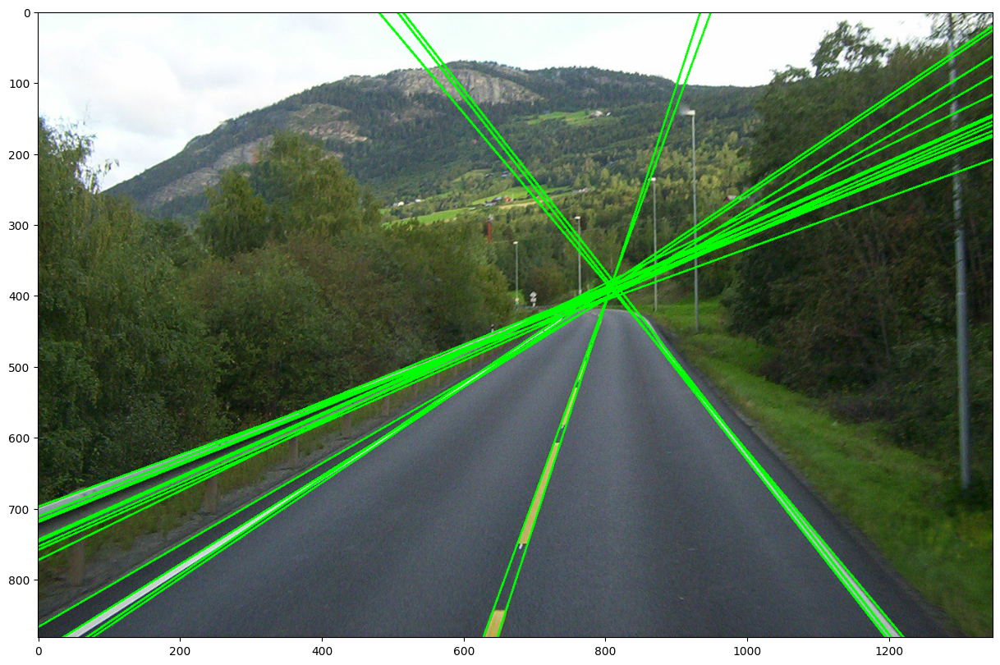

In [11]:
plt.figure(figsize=(15,10))
img_copy = norway.copy()
lines = cv2.HoughLines(edges,1.5, np.pi/90, 230)
for line in lines:
    x1, y1, x2, y2 = rhotheta2xy(line)
    cv2.line(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
plt.imshow(img_copy[..., ::-1])

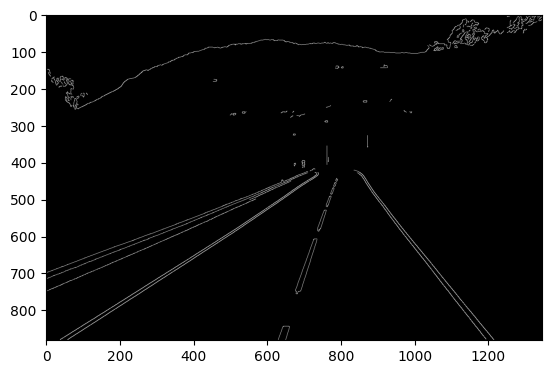

In [12]:
edges = cv2.Canny(image=gauss, threshold1=130, threshold2 = 200)
plt.imshow(edges, cmap='gray')

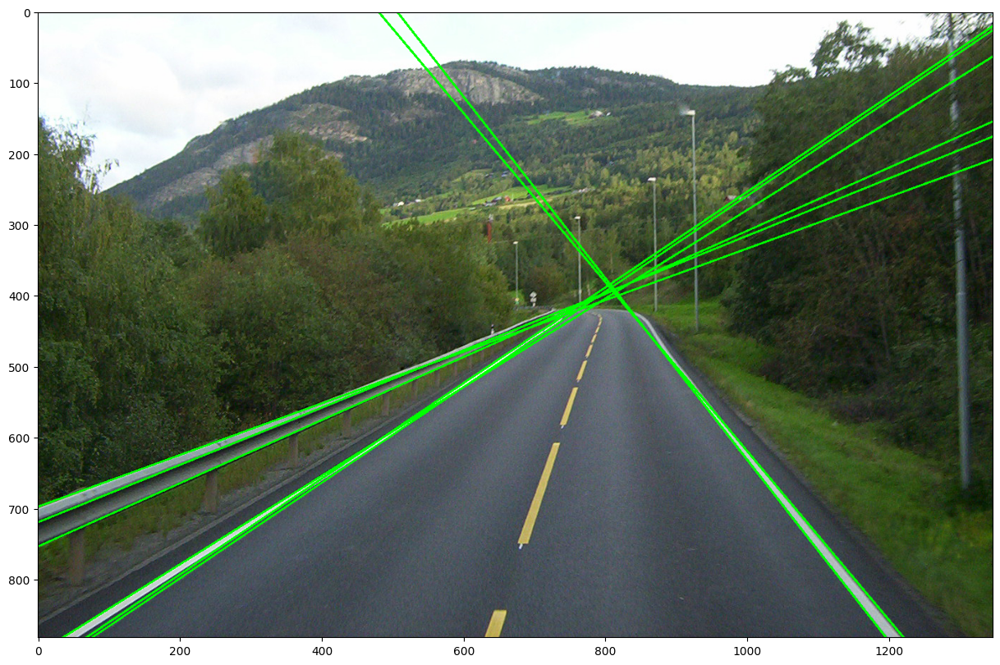

In [13]:
plt.figure(figsize=(15,10))
img_copy = norway.copy()
lines = cv2.HoughLines(edges,1.5, np.pi/90, 230)
for line in lines:
    x1, y1, x2, y2 = rhotheta2xy(line)
    cv2.line(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
plt.imshow(img_copy[..., ::-1])

#### Zadanie 2

Dany jest obraz `pillbox`. Wykorzystaj transformację Hougha dla prostych, aby wykryć krawędzie między komórkami organizera.

Dla odmiany, w tym zadaniu nie jest istotne badanie parametrów ale wyłącznie końcowy wynik.

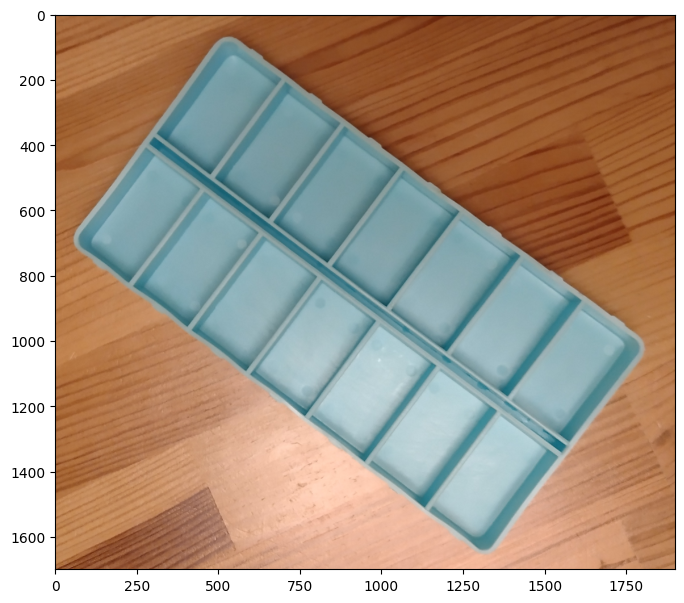

In [14]:
pillbox = cv2.imread('dane/pillbox.png')
plt.subplots(1, 1, figsize=(8,8))[1].imshow(pillbox[..., ::-1]);

Rozwiązanie:

In [15]:
pillbox_gray = cv2.cvtColor(pillbox, cv2.COLOR_BGR2GRAY)

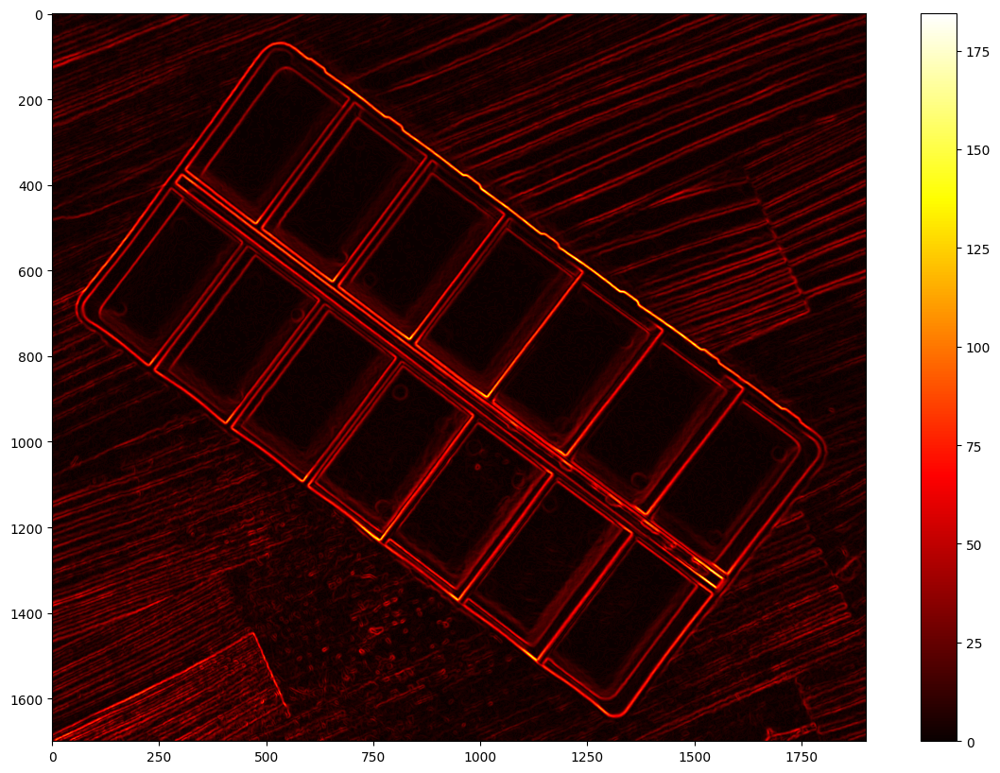

In [16]:
gauss = cv2.GaussianBlur(pillbox_gray, (9, 9), 0)
sobelx = cv2.Sobel(src=gauss, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=3)
sobely = cv2.Sobel(src=gauss, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=3)
G = np.sqrt((sobelx**2) + (sobely**2))

plt.figure(figsize=(15,10))
im = plt.imshow(G, cmap='hot')
plt.colorbar(im)

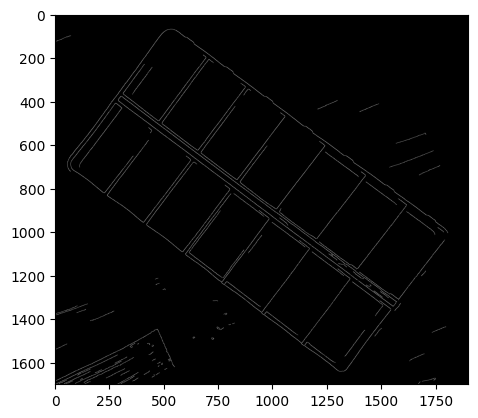

In [27]:
edges = cv2.Canny(image=gauss, threshold1=40, threshold2 = 70)
plt.imshow(edges, cmap='gray')

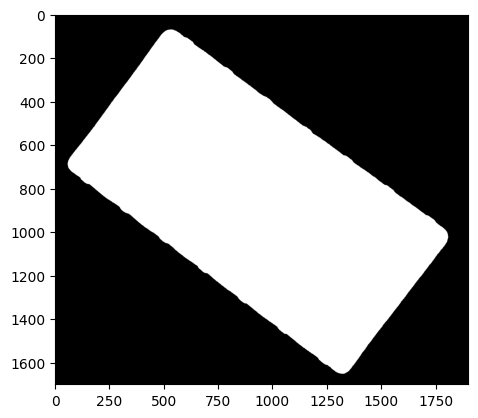

In [38]:
y,u,v = cv2.split(cv2.cvtColor(pillbox, cv2.COLOR_BGR2YUV))
mask = cv2.threshold(u, 120, 255, cv2.THRESH_BINARY)[1]
plt.imshow(mask, cmap='gray')

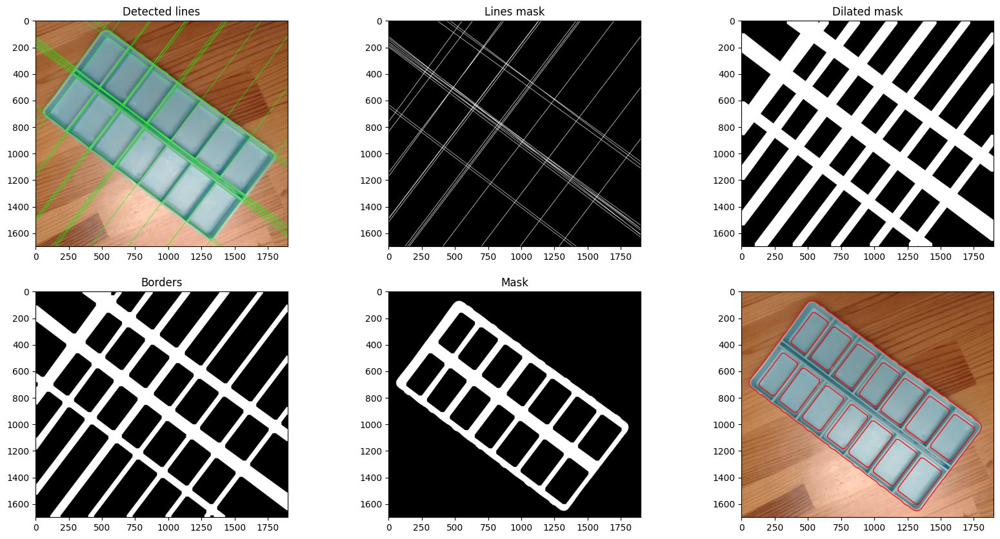

In [73]:
plt.figure(figsize=(20,10))
img_copy = pillbox.copy()
black_img = np.zeros_like(pillbox)
lines = cv2.HoughLines(edges,1.1, np.pi/160, 220)
plt.subplot(2,3,1)
for line in lines:
    x1, y1, x2, y2 = rhotheta2xy(line)
    cv2.line(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.line(black_img, (x1, y1), (x2, y2), (255, 255, 255), 2)
plt.imshow(img_copy[..., ::-1])
plt.title("Detected lines")

black_img = cv2.cvtColor(black_img, cv2.COLOR_BGR2GRAY)
plt.subplot(2,3,2)
plt.imshow(black_img, cmap='gray')
plt.title("Lines mask")

dilated = cv2.dilate(black_img, np.ones((5,5), np.uint8), iterations=11)
plt.subplot(2,3,3)
plt.imshow(dilated, cmap='gray')
plt.title("Dilated mask")

borders = cv2.erode(dilated, np.ones((5,5), np.uint8), iterations=5)
plt.subplot(2,3,4)
plt.imshow(borders, cmap='gray')
plt.title("Borders")


masked = cv2.bitwise_and(borders, borders, mask=mask)
plt.subplot(2,3,5)
plt.imshow(masked, cmap='gray')
plt.title("Mask")

contours, _ = cv2.findContours(masked, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
plt.subplot(2,3,6)
plt.imshow(cv2.drawContours(pillbox.copy(), contours, -1, (0,0,255), 5)[..., ::-1])

In [69]:
for c in contours:
    print(cv2.contourArea(c))

60942.5
60521.5
60081.0
61180.0
51054.0
60718.0
53402.5
60214.0
51368.0
50601.0
46191.0
52148.5
50995.0
43154.5
1309837.5


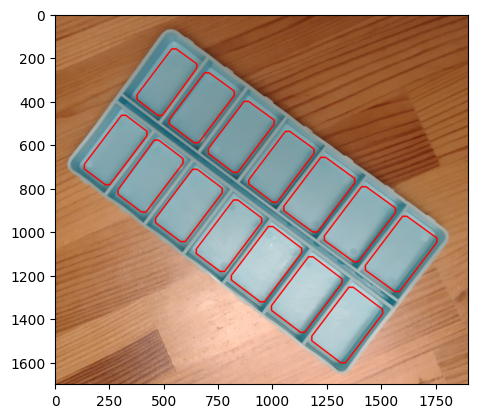

In [71]:
boxes = [c for c in contours if cv2.contourArea(c) < 100000]
plt.imshow(cv2.drawContours(pillbox.copy(), boxes, -1, (0,0,255), 5)[..., ::-1])